# Interpretation of XGBoost resuluts using SHAP, LIME


In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import lime
import lime.lime_tabular as lt
import xgboost as xgb

In [2]:
# load in the data:
#Read in the data as pandas dataframe
data = 'Statcast_data.csv'

def load_data(file):
    '''Load the Statcast_data.csv file into a pandas dataframe.
       Resolve unnecessary column in csv file'''
    baseball = pd.read_csv(file, index_col = 0)
    baseball['description'] = baseball['description'].replace({'blocked_ball': 0, 'ball': 0, "called_strike": 1})
    baseball['position_x'] = baseball['release_pos_x'] + baseball['pfx_x']
    baseball['position_z'] = baseball['release_pos_z'] + baseball['pfx_z']
    baseball['pitch_name'] = baseball['pitch_name'].replace('Knuckle Curve', 'Curveball')
    baseball = baseball[baseball.pitch_name != 'Eephus'] 
    
    final_df = baseball.loc[:, ['p_throws','pitch_name', 'position_x', 'position_z', 
                           'release_spin_rate', 'sz_top', 'sz_bot','vx0', 'vy0', 'vz0', 'description']]

    final_df=pd.get_dummies(final_df, prefix = 'pitch')
    final_df['player_name'] = baseball['player_name']
    
    final_df = final_df.dropna()
    return final_df


bsb = load_data(data)
X = bsb.drop(columns = ['player_name', 'description'])
y = bsb['description']

X.head()



,position_x,position_z,release_spin_rate,sz_top,sz_bot,vx0,vy0,vz0,pitch_L,pitch_R,pitch_2-Seam Fastball,pitch_4-Seam Fastball,pitch_Changeup,pitch_Curveball,pitch_Cutter,pitch_Sinker,pitch_Slider,pitch_Split Finger
0,4.9868,5.6846,2314.0,3.2971,1.5059,-9.8035,-138.1130,0.1339,1,0,1,0,0,0,0,0,0,0
1,4.1077,6.3981,2324.0,3.3136,1.5730,-9.0084,-140.5865,-2.4218,1,0,0,1,0,0,0,0,0,0
2,2.3349,4.9982,2521.0,3.9119,1.7080,-3.7285,-117.3223,1.2140,1,0,0,0,0,0,0,0,1,0
3,4.4509,6.1538,2329.0,3.5553,1.5639,-12.0533,-139.3669,-5.1407,1,0,0,1,0,0,0,0,0,0
4,4.5827,5.8014,2437.0,3.3450,1.6241,-14.0287,-139.8559,-3.3434,1,0,0,1,0,0,0,0,0,0


In [3]:
#load in the model
from sklearn.externals import joblib
xgb_pipe = joblib.load('Models/tuned_xgboost.sav')
xgb_clf = xgb_pipe.steps[1][1]



In [4]:
xgb_clf

XGBClassifier(base_score=0.5, booster='gbtree',
       colsample_bylevel=0.7986018512657694,
       colsample_bytree=0.5658297037026186, gamma=4.435972468411827e-08,
       learning_rate=0.10422349176118588, max_delta_step=20, max_depth=38,
       min_child_weight=5, missing=nan, n_estimators=100, n_jobs=1,
       nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=1e-09, reg_lambda=1.5855086670478623e-06,
       scale_pos_weight=3.635538323811738, seed=None, silent=True,
       subsample=1.0)

In [5]:
#split the data using same dimensions in the pipeline file
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 777)

#xgb_clf.fit(X_train, y_train)

#get indicies of certain pitch results
#strike_idx = [y_test.index[y_test == 1]]
#ball_idx = [y_test.index[y_test == 0]]

# SHAP & LIME COMPARISON/UNISON

In [6]:
np.random.randint(1,25)

9

In [7]:
import lime
import lime.lime_tabular as lt
np.random.seed(777)
predict_fnxgb = lambda x: xgb_clf.predict_proba(x)
#Build the explainer on the 
explainer = lt.LimeTabularExplainer(X_train.values, mode = 'classification', 
                                    feature_names=list(X_train.columns), 
                                    class_names = ['ball', 'called strike'])
np.random.seed(777)
for i in [7,13]:
    i*=np.random.randint(1,20)
    print(f"Actual Value: {y_test.values[i]} \n ")
    exp = explainer.explain_instance(X_test.values[i], predict_fn=predict_fnxgb)
    exp.show_in_notebook(show_predicted_value=True, show_all = True)
    exp.save_to_file('test' + str(i) + '.html', )

Actual Value: 0 
 


Actual Value: 1 
 


In [9]:
import lime
import lime.lime_tabular as lt
np.random.seed(777)
predict_fnxgb = lambda x: xgb_clf.predict_proba(x)
#Build the explainer on the 
explainer = lt.LimeTabularExplainer(X_train.values, mode = 'classification', 
                                    feature_names=list(X_train.columns), 
                                    class_names = ['ball', 'called strike'])
np.random.seed(777)
for i in [6,12,18]:
    i*=np.random.randint(1,20)
    print(f"Actual Value: {y_test.values[i]} \n ")
    exp = explainer.explain_instance(X_test.values[i], predict_fn=predict_fnxgb)
    exp.show_in_notebook(show_predicted_value=True, show_all = True)

Actual Value: 1 
 


Actual Value: 1 
 


Actual Value: 1 
 


## SHAP

In [10]:
import shap
from shap import TreeExplainer
shap.initjs()

explainer_shap = shap.TreeExplainer(xgb_clf)
shap_values = explainer_shap.shap_values(X_test)

In [46]:
def shap_force_plot_instance(i):
    print(f"Actual Value: {y_test.iloc[i]}")
    return shap.force_plot(explainer_shap.expected_value, shap_values[i,:], X_test.iloc[i,:])

    
np.random.seed(777)

i=np.random.randint(1,20)
shap_force_plot_instance(5*i)

Actual Value: 1


In [55]:
shap_force_plot_instance(6*i)

Actual Value: 0


In [59]:
shap_force_plot_instance(7*i)

Actual Value: 0


## Summary Plot: Feature Importances

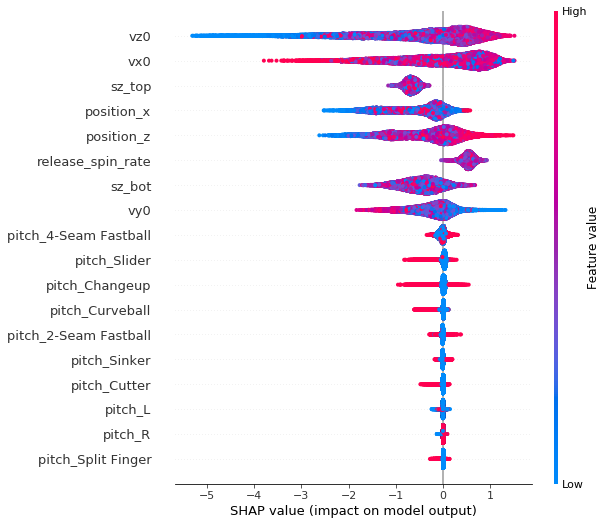

In [116]:
shap.summary_plot(shap_values, X_test)

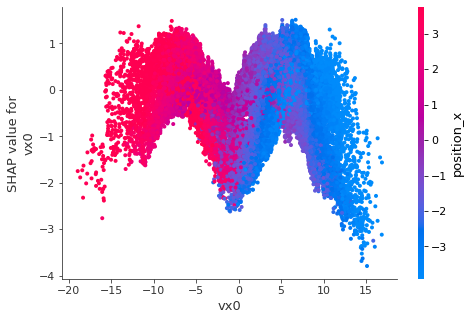

In [62]:
shap.dependence_plot('vx0', shap_values, X_test)

##

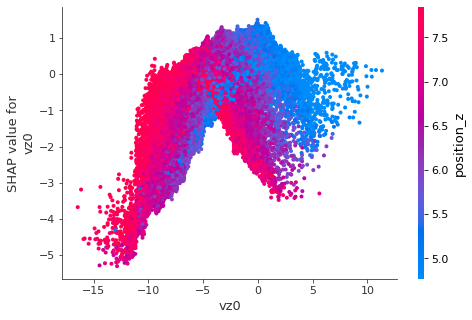

In [61]:
shap.dependence_plot('vz0', shap_values, X_test)

## Likelihood of throwing a strike becomes less unlikely as the velocity in the z-dimension increases, up to a point. 

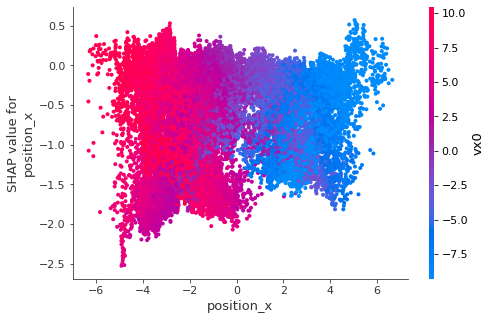

In [63]:
shap.dependence_plot('position_x', shap_values, X_test)

## 

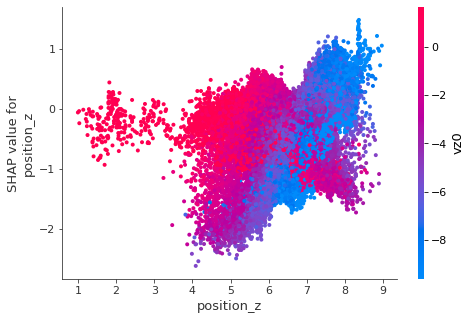

In [64]:
shap.dependence_plot('position_z', shap_values, X_test)

### Pitches with a larger negative value but a high position_z value, 

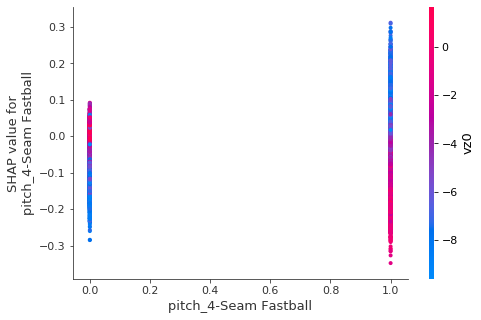

In [112]:
shap.dependence_plot('pitch_4-Seam Fastball', shap_values, X_test)

# Interaction Shap

In [43]:
#for computational purposes, take a sample of 5000 predictions
shap_interaction_values = explainer_shap.shap_interaction_values(X_test.iloc[:5000,:])

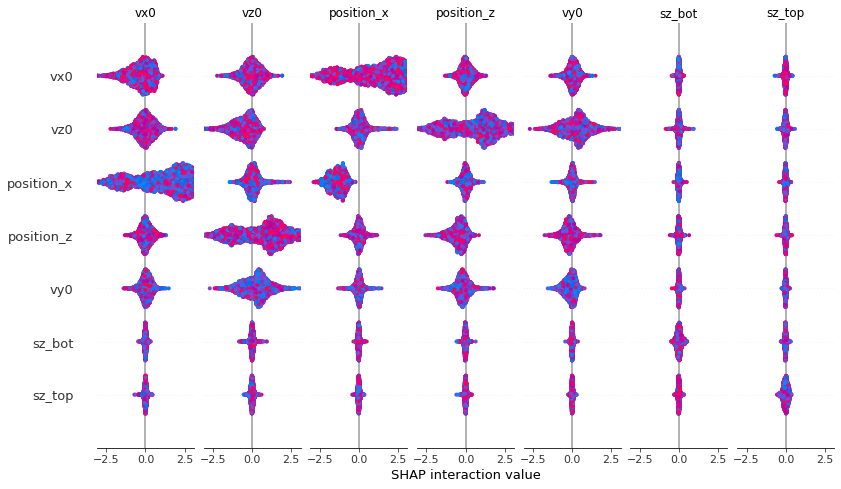

In [44]:
shap.summary_plot(shap_interaction_values, X.iloc[:5000,:])


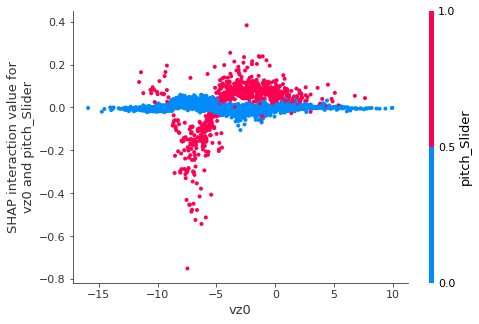

In [49]:
shap.dependence_plot(
    ("vz0", "pitch_Slider"),
    shap_interaction_values, X_test.iloc[:5000,:],
    #display_features=X_test.iloc[:5000,:]
)

## "To throw a slider for a higher chance of a strike, the ball needs to be traveling between slightly downward to slightly upward out of the hand, anywhere from -2 to 1.5 ft/s

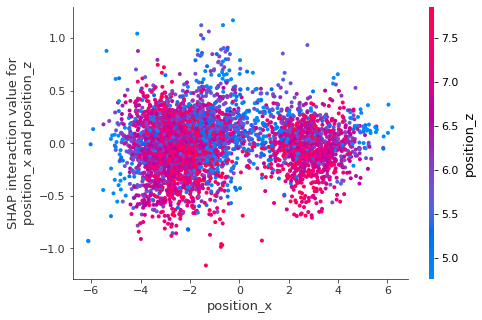

In [76]:
shap.dependence_plot(("position_x", "position_z"),
    shap_interaction_values, X_test.iloc[:5000,:],)

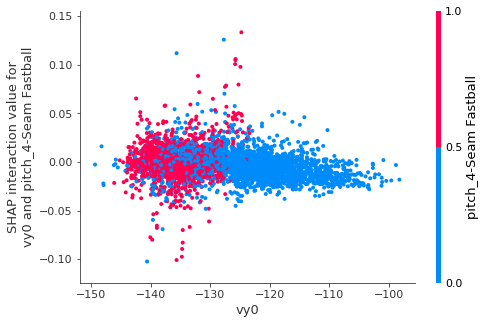

In [72]:
shap.dependence_plot(( 'vy0', 'pitch_4-Seam Fastball'),
                    shap_interaction_values, X_test.iloc[:5000,:])

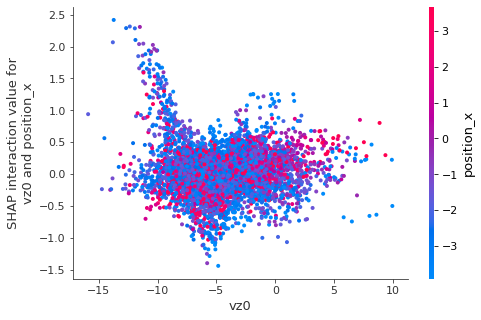

In [88]:
shap.dependence_plot(( 'vz0', 'position_x'),
                    shap_interaction_values, X_test.iloc[:5000,:])

# Using LIME to look at individual pitcher

Chris Sale. He is the first pitcher in the dataframe. 

1. Get index of chris sale in original data
2. Match that index to the X_test index
3. Show LIME results on Chris Sale

In [188]:
Nola = (bsb[bsb['player_name'] == 'Aaron Nola'])
Nola

,position_x,position_z,release_spin_rate,sz_top,sz_bot,vx0,vy0,vz0,description,pitch_L,pitch_R,pitch_2-Seam Fastball,pitch_4-Seam Fastball,pitch_Changeup,pitch_Curveball,pitch_Cutter,pitch_Sinker,pitch_Slider,pitch_Split Finger,player_name
26950,-0.7156,4.1745,2527.0,3.5664,1.6547,0.9182,-111.7011,4.0391,1,0,1,0,0,0,1,0,0,0,0,Aaron Nola
26951,-2.9830,5.8291,1981.0,3.6715,1.6219,3.8882,-131.0549,-0.8536,0,0,1,0,1,0,0,0,0,0,0,Aaron Nola
26952,-0.7937,4.2481,2609.0,3.5139,1.7241,3.9368,-113.0993,1.9620,1,0,1,0,0,0,1,0,0,0,0,Aaron Nola
26953,-3.2929,5.4886,1964.0,3.6317,1.5476,9.9396,-131.9842,-5.5210,0,0,1,1,0,0,0,0,0,0,0,Aaron Nola
26954,-0.7053,4.1914,2540.0,3.5112,1.6115,4.3353,-114.8750,1.4175,0,0,1,0,0,0,1,0,0,0,0,Aaron Nola
26955,-2.9998,5.8527,2072.0,3.5108,1.6111,5.8175,-136.5979,-2.1142,1,0,1,0,1,0,0,0,0,0,0,Aaron Nola
26956,-3.1869,5.9184,2261.0,3.4162,1.7165,9.4148,-137.6221,-5.5338,0,0,1,0,1,0,0,0,0,0,0,Aaron Nola
26957,-2.7454,6.1029,1993.0,3.7034,1.7724,10.9753,-134.1717,-7.6484,0,0,1,0,1,0,0,0,0,0,0,Aaron Nola
26958,-3.1451,5.6840,2001.0,4.0188,1.7391,5.6774,-134.5842,-2.4589,1,0,1,0,1,0,0,0,0,0,0,Aaron Nola
26959,-3.7463,5.5871,2151.0,3.8976,1.7311,6.9143,-133.7330,-3.5337,1,0,1,1,0,0,0,0,0,0,0,Aaron Nola


In [204]:
X_test_sorted = X_test.sort_index()
y_test_sorted = y_test.sort_index()
X_test_sorted.iloc[6714:6802,:]

,position_x,position_z,release_spin_rate,sz_top,sz_bot,vx0,vy0,vz0,pitch_L,pitch_R,pitch_2-Seam Fastball,pitch_4-Seam Fastball,pitch_Changeup,pitch_Curveball,pitch_Cutter,pitch_Sinker,pitch_Slider,pitch_Split Finger
26956,-3.1869,5.9184,2261.0,3.4162,1.7165,9.4148,-137.6221,-5.5338,0,1,0,1,0,0,0,0,0,0
26959,-3.7463,5.5871,2151.0,3.8976,1.7311,6.9143,-133.7330,-3.5337,0,1,1,0,0,0,0,0,0,0
26968,-0.6934,4.1250,2404.0,3.3161,1.5800,0.3420,-113.5492,2.4875,0,1,0,0,0,1,0,0,0,0
26969,-0.6173,4.1463,2342.0,3.6669,1.7073,0.5330,-111.8815,1.8667,0,1,0,0,0,1,0,0,0,0
26970,-3.6039,5.5644,1857.0,3.4350,1.5635,4.2918,-129.6660,-2.1535,0,1,1,0,0,0,0,0,0,0
26973,-0.4755,3.9050,2598.0,3.6206,1.7300,2.3184,-113.4002,1.6665,0,1,0,0,0,1,0,0,0,0
26978,-0.8842,3.8703,2596.0,3.0933,1.4640,-0.6033,-112.5007,2.2458,0,1,0,0,0,1,0,0,0,0
26979,-3.6858,5.0075,1607.0,3.3260,1.3904,5.6228,-123.7781,-1.4529,0,1,0,0,1,0,0,0,0,0
26981,-0.6505,3.9962,2553.0,3.3054,1.5796,1.4567,-114.9238,1.6738,0,1,0,0,0,1,0,0,0,0
26985,-0.5108,4.2843,2540.0,3.3803,1.6016,5.2498,-115.2464,1.1015,0,1,0,0,0,1,0,0,0,0


In [11]:
for i in [6727, 6791, 6776, 6789]:
    print(f"Actual Value: {y_test_sorted.values[i]} \n ")
    exp = explainer.explain_instance(X_test_sorted.values[i], predict_fn=predict_fnxgb, num_features=8)
    exp.show_in_notebook(show_predicted_value=True, show_all = True )

NameError: name 'y_test_sorted' is not defined

## Analysis:

Looking at a specific pitcher: Aaron Nola
In the first three explanations, the model had high confidence in its accurate prediction. In the first example, the main factors for the pitch's prediction is the ball's z-dimension position and the velocity the x-dimension. In fact, a value of position_z <= 5.91 is a strong threshold value for predicting a ball. This value is a combination of his release point and the amount of movement in that dimension, so the combination of Nola's release point and his movement on that axis being below that threshold value is a strong indicator of the model's predictoin. Additionally, his velocity in the x-dimension is greater than 7.07, which means that the pitch is moving (from the catcher's perspectie) rightward at a velocity over 7.07 ft/s. Since the velocity of the pitch in the x-dimension is above such a value, this could indicate that the pitch will land too far off of the plate to be deemed a strike. Thus, a lateral velocity of this value contributes to a high confidence in a predicted ball. 

We see a similar story in the next two examples, but for a strike. The vz0 feature value contributes most to the prediction. Additionally, it shows that since the value of the vx0 also contributes significantly. This is important because the key difference between a 2-Seam Fastball and a 4-Seam Fastball is that the style of the grip used in a 2-Seam fastball makes the baseball move laterally more than a 4-Seam Fastball; the spin the ball aquires when throwing a 2-Seam as it travels to home plate will affect the ball by 'pushing' the ball to the side. Thus, side movement is an important component of controlling a 2-Seam Fastball well. In our third prediction, we see that the second significant feature is vx0, and it is showing that since the ball had a certain amount of lateral movement, that value contributed to the model predicting a strike. Thus, the combination of 2-Seam Fastball = 1 capturing the range of values for vx0 suggest that our model is capturing such an interaction affect, and it deems such an interaction important. 

There are limitations to our model however. LIME can be used as a diagnostic method to gauge our model's 'thinking'. In the last pitch, our model incorrectly predicted a strike when in fact it was a ball. A strong reason for its incorrect prediction is that, like the second pitch, its vz0 value was equal to -2.03, in which -4.48 < vz0 <= -2.03, similar to the second pitch. Even though the last pitch was on the threshold value of that 'statement', it was enough to 'persuade' the model's prediction to called strike. As such, this helps us learn that our model is finding some general rules  

# Interpretation

We can see the confidence level in the model's prediction, along with the values 